In [1]:
import pandas as pd
import numpy as np
import mne
import os

import matplotlib.pyplot as plt
import plotly.io as pio
import plotly.express as px
import plotly.graph_objects as go
import plotly.subplots as sp

from scipy import signal
from scipy.signal import lfilter
from mne.preprocessing import ICA
from mne.time_frequency import tfr_morlet

* Import electrode locations and names

* This code loads a txt file that was generated with the help of an open source software called Cartool64, which allows to modify existing montage template into a 2D frame with x,y, and z coordinates as well as electrode names.

In [2]:
electrodes = pd.read_csv("electrode_locations/eeg_cap_mapped_electrodes.txt", sep='\s+', header=None, names=['x', 'y', 'z', 'name'])
electrodes

,x,y,z,name
0,0.951056,0.309017,-0.000000,Fp1
1,0.951056,-0.309017,-0.000000,Fp2
2,0.587785,0.809017,-0.000000,F7
3,0.659057,0.533694,0.529919,F3
4,0.694658,0.000000,0.719340,Fz
5,0.659057,-0.533694,0.529919,F4
6,0.587785,-0.809017,-0.000000,F8
7,0.309017,0.951056,-0.000000,FT7
8,0.348885,0.656158,0.669131,FC3
9,0.358368,0.000000,0.933580,FCz


In [3]:
data = pd.read_csv("data/0014.txt", sep='\t', index_col=False, header=0)

# Remove the 0 rows in the EVENT1 column
data = data[data['EVENT1'] != 0]

# Notch filter
sampling_rate = 1000 # signal samples per second
notch_freq = 50 #Hz
notch_bw = 2 #Hz

eeg_mask = data.columns != 'EVENT1'
b, a = signal.iirnotch(notch_freq, notch_bw, sampling_rate)
filtered_data = signal.lfilter(b, a, data.loc[:, eeg_mask], axis=0)
filtered_df = data.copy()
filtered_df.loc[:, eeg_mask] = filtered_data

eeg_data = filtered_df.values[:, ].T

# specify electrode names and positions
n_channels = eeg_data.shape[0]

# Old channel types & names
#ch_names = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'Oz', 'O2', 'A1', 'A2', 'FC5', 'FC1', 'FC2', 'FC6', 'CP5', 'CP1', 'EVENT1']
# Complete channel names and positions based on the EEG Cap picture
# ch_names = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'FT7', 'FC3', 'FCz', 'FC4', 'FT8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'TP7', 'CP3', 'CPz', 'CP4', 'TP8', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'Oz', 'O2', 'A1', 'A2','EVENT1']

# Proper channel names (excluding TP7 & TP8 which are often problematic and removed)
ch_names = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'FT7', 'FC3', 'FCz', 'FC4', 'FT8', 'T7', 'C3', 'Cz', 'C4', 'T8', 'CP3', 'CPz', 'CP4', 'P7', 'P3', 'Pz', 'P4', 'P8', 'O1', 'Oz', 'O2', 'EVENT1']

ch_types = ['eeg'] * (len(ch_names) - 1) + ['stim']
sfreq = 1000

info = mne.create_info(ch_names, sfreq, ch_types)

montage = mne.channels.make_standard_montage('standard_1020')

raw = mne.io.RawArray(eeg_data, info)
raw.set_montage(montage)

# Drop the channels detecting eyelid movements
raw = raw.drop_channels(['Fp1', 'Fp2'])

print(raw.info)

Creating RawArray with float64 data, n_channels=29, n_times=229379
    Range : 0 ... 229378 =      0.000 ...   229.378 secs
Ready.
<Info | 8 non-empty values
 bads: []
 ch_names: F7, F3, Fz, F4, F8, FT7, FC3, FCz, FC4, FT8, T7, C3, Cz, C4, T8, ...
 chs: 26 EEG, 1 Stimulus
 custom_ref_applied: False
 dig: 31 items (3 Cardinal, 28 EEG)
 highpass: 0.0 Hz
 lowpass: 500.0 Hz
 meas_date: unspecified
 nchan: 27
 projs: []
 sfreq: 1000.0 Hz
>


* Visualize channel location and names based on the latest addition

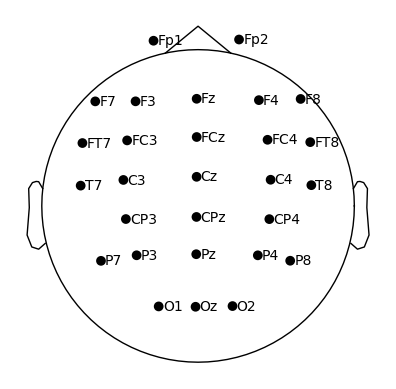

In [4]:
info.set_montage(montage)
fig = plt.figure()
ax2d = fig.add_subplot(111)
mne.viz.plot_sensors(info, show_names=True, axes=ax2d)
ax2d.set_title("2D Electrode Locations")
plt.show()

In [5]:
events = mne.find_events(raw, stim_channel='EVENT1')
print(events[:10])

Trigger channel has a non-zero initial value of 16 (consider using initial_event=True to detect this event)
243 events found
Event IDs: [ 24  56 120]
[[    3    16    24]
 [    6    24    56]
 [   33    56   120]
 [20774     8    24]
 [20783    24    56]
 [20816    56   120]
 [23294     8    24]
 [23302    24    56]
 [23335    56   120]
 [25813     8    24]]


* Examining the stimuli:
    
    * MNE detects 243 events in total but in fact, we are interested in the events that are part of the 120 group only.
    * 16, 24, and 56 are not smimuli but rather residuals from the TTL signal.

* Applying additional high and low band filters over the signal

In [6]:
raw = raw.filter(l_freq=1, h_freq=100)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 1e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 100.00 Hz
- Upper transition bandwidth: 25.00 Hz (-6 dB cutoff frequency: 112.50 Hz)
- Filter length: 3301 samples (3.301 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  26 out of  26 | elapsed:    0.0s finished


* Now lets read in the stumli material

In [7]:
stimuli_df = pd.read_excel("data/FacesERP_05.xls")
stimuli_df

,Block,Condition
0,1,ScrambledFace
1,2,UprightFace
2,3,ScrambledFace
3,4,UprightFace
4,5,InvertedFace
...,...,...
75,76,InvertedFace
76,77,InvertedFace
77,78,InvertedFace
78,79,Object


* We can now create the epochs object using the events that are part of the 120 group

In [8]:
event_id_map = {'ScrambledFace': 1, 'UprightFace': 2, 'InvertedFace': 3, 'Object': 4}

# Split the groups of 120 into the event types from the stimulus data
event_type_order = stimuli_df['Condition'].tolist()
n_events = len(events)

for i in range(n_events):
    if events[i, -1] == 120:
        if not event_type_order:
            print(f"Skipping event {i} because event_type_order is empty")
            continue
        event_type = event_type_order.pop(0)
        event_id = event_id_map[event_type]
        events[i, -1] = event_id

# Extract epochs for each trial
tmin = -1  # start time before the event
tmax = 1  # end time after the event
baseline = None  # no baseline correction

epochs = mne.Epochs(raw, events, event_id=event_id_map, tmin=tmin, tmax=tmax, baseline=baseline, preload=True)

Skipping event 242 because event_type_order is empty
Not setting metadata
80 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 80 events and 2001 original time points ...
1 bad epochs dropped


* This indicates that event 242 was dropped. The dropped event corresponds to the ScrambledFace condition.

In [26]:
epochs

Number of events,79
Events,InvertedFace: 20Object: 20ScrambledFace: 19UprightFace: 20
Time range,-1.000 – 1.000 sec
Baseline,off


# Basic visualization

In [10]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=filtered_df.index, y=filtered_df['EVENT1'], mode='lines', name='EVENT1'))
fig.update_layout(
    title="EVENT1 Channel",
    xaxis_title="Time (samples)",
    yaxis_title="Amplitude",
)
fig.update_layout(width=1750, height=600)
fig.update_layout(xaxis=dict(gridcolor='rgba(0,0,0,0)'),
                  yaxis=dict(gridcolor='rgba(0,0,0,0)'))
fig.show()

* Important remarks from the plot:
    - First & last groups of 120 evwents appear abnormally long and I have no explanation why, perhaps due to the specific recording.
    - It is a good idea to drop the first and last epochs for the sake of consistency and compare the results

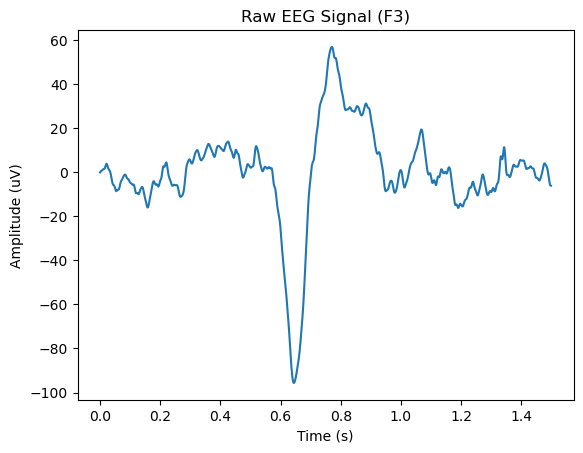

In [13]:
channel_index = 1
channel_name = raw.ch_names[channel_index]

start_time = 0
end_time = 1500

data, times = raw[channel_index, start_time:end_time]

fig, ax = plt.subplots()
ax.plot(times, data.T)
ax.set(title=f'Raw EEG Signal ({channel_name})', xlabel='Time (s)', ylabel='Amplitude (uV)')
plt.show()

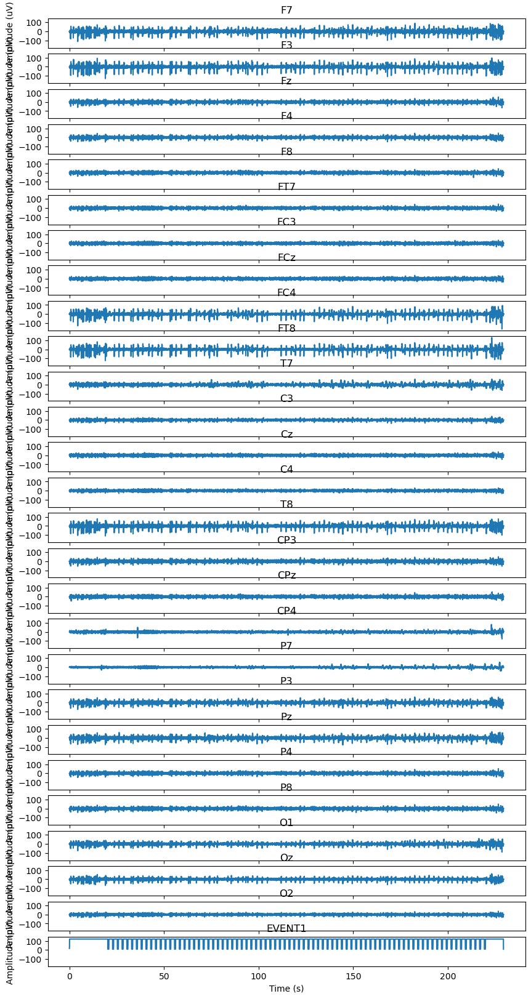

In [12]:
start_time = 0
end_time = 229379

fig, axes = plt.subplots(nrows=len(raw.ch_names), sharex=True, sharey=True, figsize=(10, 20))
for channel_index, channel_name in enumerate(raw.ch_names):
    data, times = raw[channel_index, start_time:end_time]
    axes[channel_index].plot(times, data.T)
    axes[channel_index].set(title=channel_name, ylabel='Amplitude (uV)')
axes[-1].set(xlabel='Time (s)')
plt.show()

* Generate & save an interactive HTML plot of all channels for the duration of the entire recording

In [ ]:
start_time = 0
end_time = 229379
n_channels = len(raw.ch_names)

fig = sp.make_subplots(rows=n_channels, cols=1, shared_xaxes=True, vertical_spacing=0.01)

for channel_index, channel_name in enumerate(raw.ch_names):
    data, times = raw[channel_index, start_time:end_time]
    fig.add_trace(go.Scatter(x=times, y=data.T.squeeze(), showlegend=False, name=channel_name), row=channel_index + 1, col=1)
    fig.update_yaxes(title_text=channel_name, row=channel_index + 1, col=1)

fig.update_layout(height=5000, width=1900)
fig.update_xaxes(title_text="Time (s)", row=n_channels, col=1)

#fig.show()

# Save the interactive plot as an HTML file
pio.write_html(fig, file='eeg_channels_plot.html', auto_open=True)

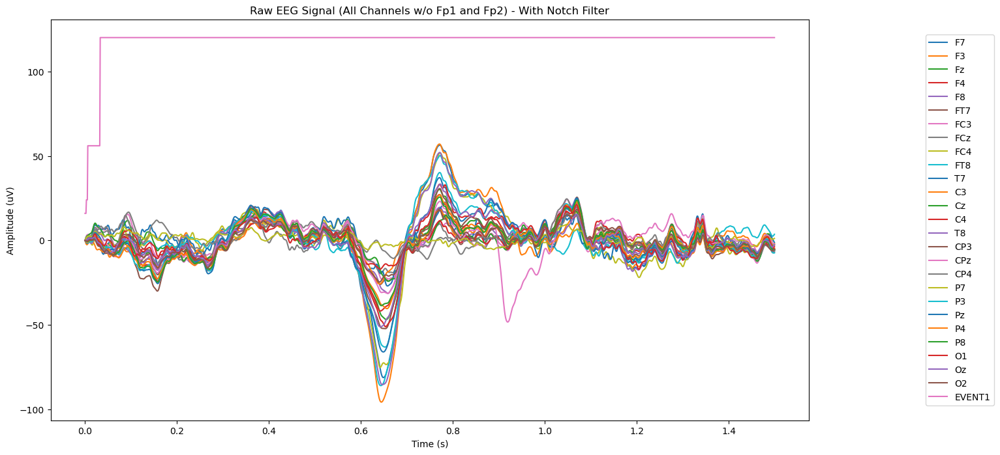

In [14]:
start_time = 0
end_time = 1500

data, times = raw[:, start_time:end_time]

fig, ax = plt.subplots(figsize=(15, 8))
for i in range(data.shape[0]):
    ax.plot(times, data[i, :], label=raw.ch_names[i])
ax.set(title='Raw EEG Signal (All Channels w/o Fp1 and Fp2) - With Notch Filter', xlabel='Time (s)', ylabel='Amplitude (uV)')
ax.legend(loc='right', bbox_to_anchor=(1.25, 0.5))
plt.show()
plt.close(fig)

* Interactive plot

In [15]:
start_time = 0
end_time = 1500

data, times = raw[:, start_time:end_time]

traces = []
for i, channel_name in enumerate(raw.ch_names):
    trace = go.Scatter(x=times, y=data[i], name=channel_name)
    traces.append(trace)

layout = go.Layout(title='Raw EEG Signal (All Channels w/o Fp1 and Fp2) - With Notch Filter',
                   xaxis=dict(title='Time (s)'),
                   yaxis=dict(title='Amplitude (uV)'),
                   legend=dict(x=1.1, y=1))

fig = go.Figure(data=traces, layout=layout)
fig.update_layout(width=1500, height=900) # change these values to fit the plot to your screen size
fig.update_layout(xaxis=dict(gridcolor='rgba(0,0,0,0)'),
                  yaxis=dict(gridcolor='rgba(0,0,0,0)')) # Removing the gridlines from the plot
fig.show()

In [16]:
epochs

Number of events,79
Events,InvertedFace: 20Object: 20ScrambledFace: 19UprightFace: 20
Time range,-1.000 – 1.000 sec
Baseline,off


* The epochs object look really good and we can continue with the analysis.

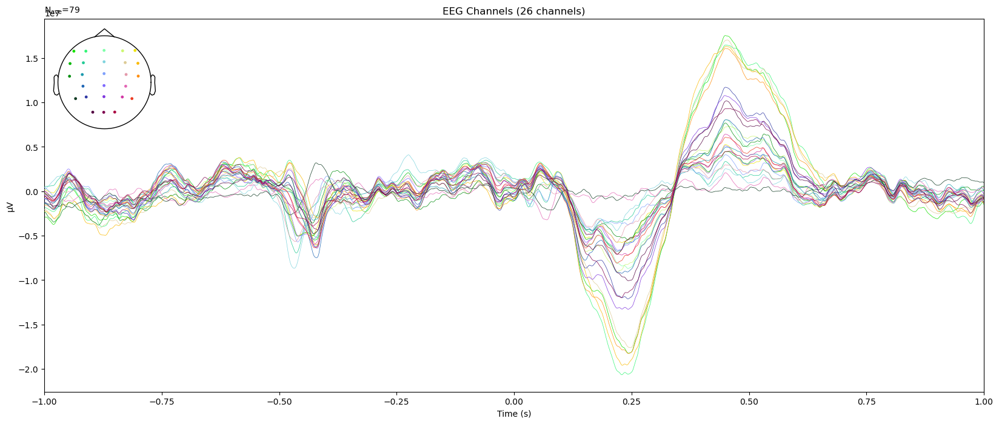

In [17]:
# ERP Plot
# compute the evoked response
evoked = epochs.average()
fig, ax = plt.subplots(figsize=(20, 8))
evoked.plot(time_unit='s', picks='eeg', titles=dict(eeg='EEG Channels'), axes=ax)
plt.close(fig)

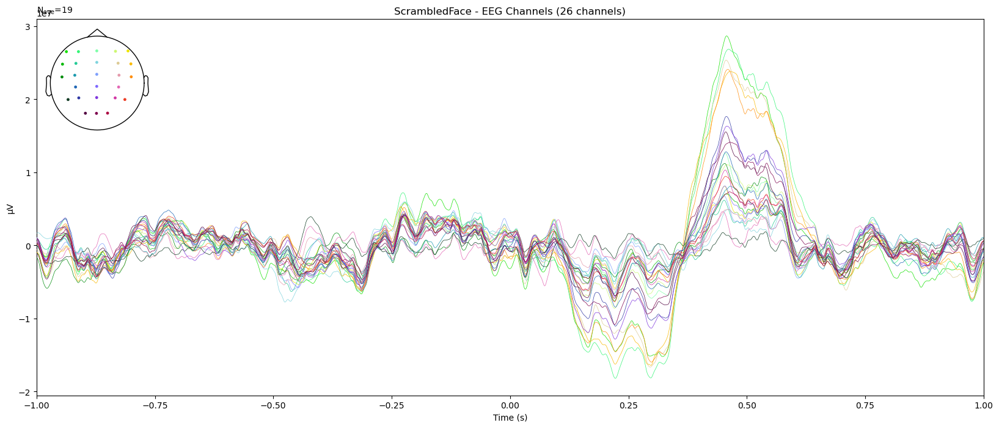

In [27]:
# Average the epochs for the 'ScrambledFace' condition
scrambled_epochs = epochs['ScrambledFace']
scrambled_evoked = scrambled_epochs.average()

# Plot the ERP waveform
fig, ax = plt.subplots(figsize=(20, 8))
scrambled_evoked.plot(time_unit='s', picks='eeg', titles=dict(eeg='ScrambledFace - EEG Channels'), axes=ax)
plt.close(fig)

* Plot each condition by averaging the signal using mean, median and global field power.

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


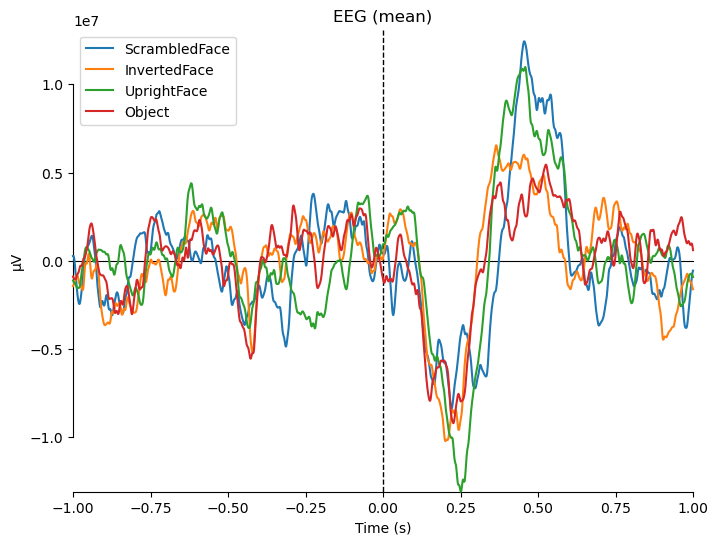

combining channels using "median"
combining channels using "median"
combining channels using "median"
combining channels using "median"


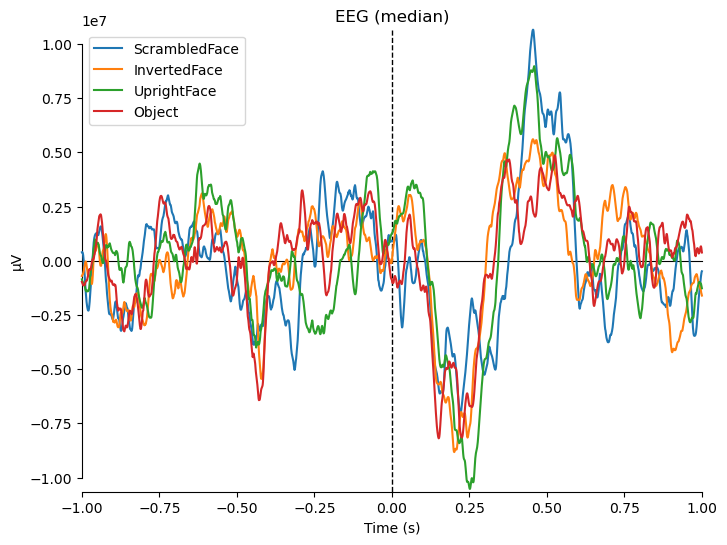

combining channels using "gfp"
combining channels using "gfp"
combining channels using "gfp"
combining channels using "gfp"


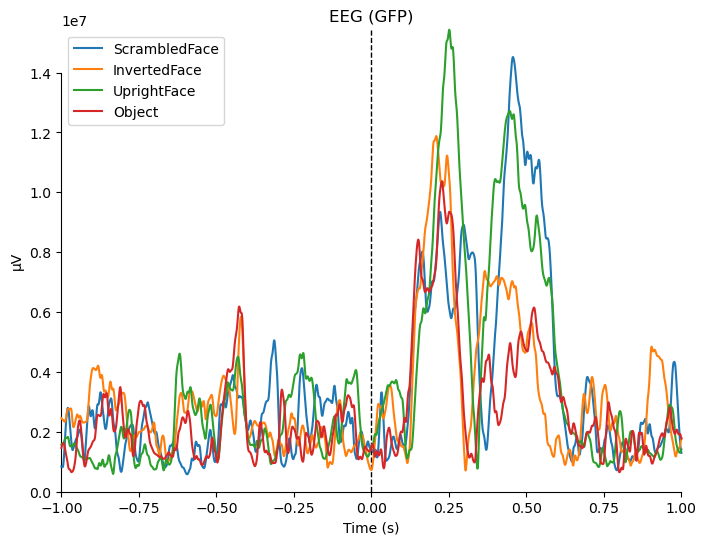

combining channels using "<function custom_func at 0x000002259C19CE50>"
combining channels using "<function custom_func at 0x000002259C19CE50>"
combining channels using "<function custom_func at 0x000002259C19CE50>"
combining channels using "<function custom_func at 0x000002259C19CE50>"


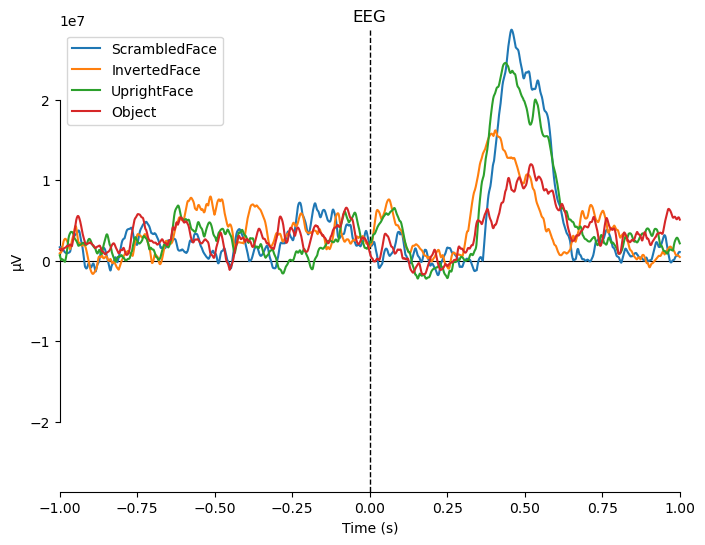

In [19]:
# Average the epochs for each condition
scrambled_epochs = epochs['ScrambledFace'].average()
inverted_epochs = epochs['InvertedFace'].average()
upright_epochs = epochs['UprightFace'].average()
object_epochs = epochs['Object'].average()

# Create a dictionary with the condition names and evoked responses
evokeds_dict = {'ScrambledFace': scrambled_epochs,
                'InvertedFace': inverted_epochs,
                'UprightFace': upright_epochs,
                'Object': object_epochs}

def custom_func(x):
    return x.max(axis=1)

for combine in ('mean', 'median', 'gfp', custom_func):
    mne.viz.plot_compare_evokeds(evokeds_dict, picks='eeg', combine=combine)

* Compute the ERP per condition for all channels

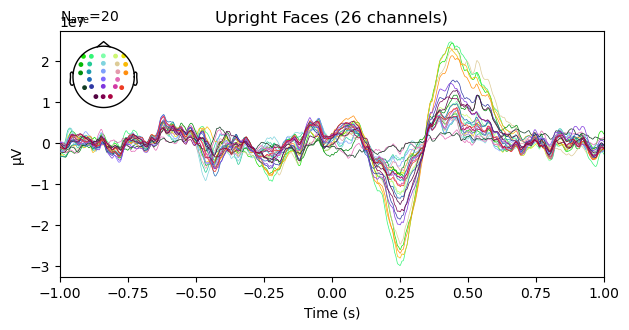

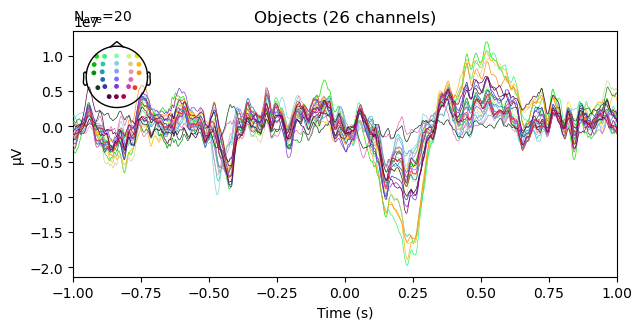

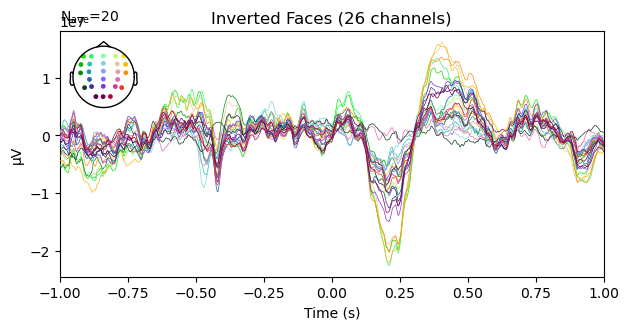

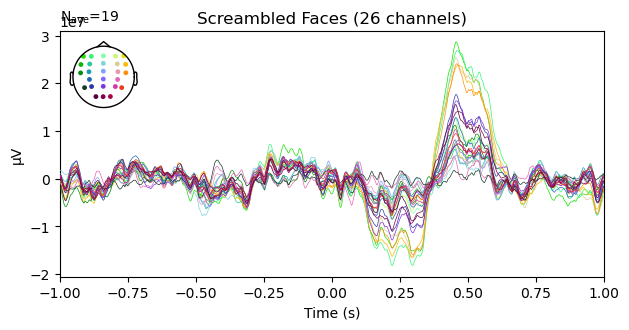

In [20]:
scrambled_epochs = epochs['ScrambledFace'].average()
inverted_epochs = epochs['InvertedFace'].average()
upright_epochs = epochs['UprightFace'].average()
object_epochs = epochs['Object'].average()

fig1 = upright_epochs.plot(titles='Upright Faces')
fig2 = object_epochs.plot(titles='Objects')
fig3 = inverted_epochs.plot(titles='Inverted Faces')
fig4 = scrambled_epochs.plot(titles='Screambled Faces')

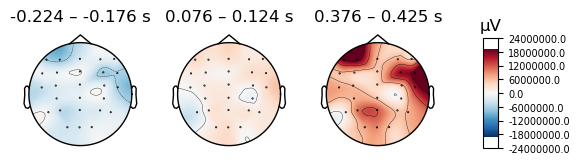

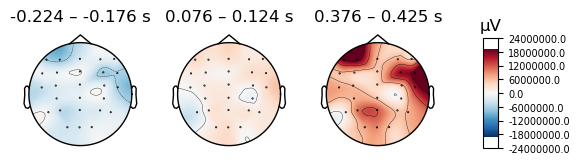

In [21]:
upright_epochs.plot_topomap(times=[-0.2, 0.1, 0.4], average=0.05)

* Global Field Power Plot (Note - always positive)

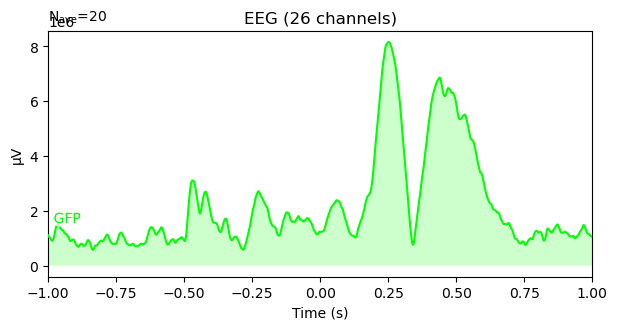

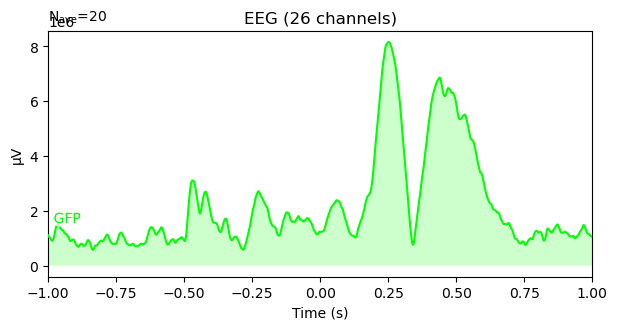

In [22]:
upright_epochs.plot(gfp='only')

* Compare evoked potentials 

combining channels using "mean"
combining channels using "mean"


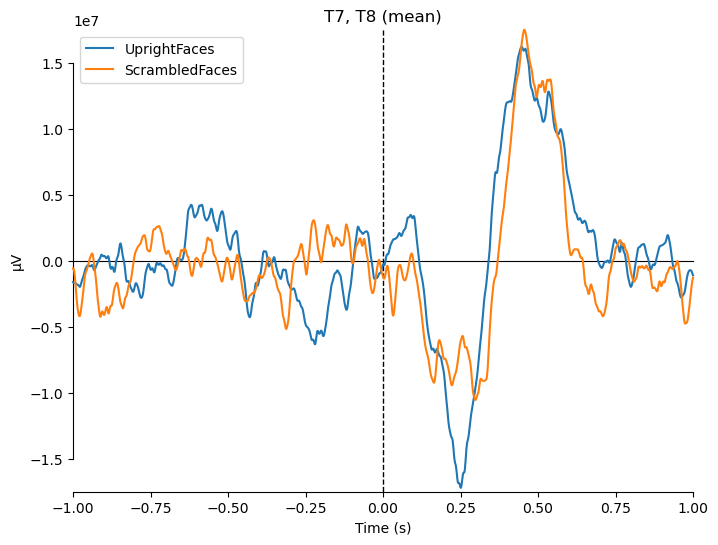

[<Figure size 800x600 with 1 Axes>]

In [23]:
evokeds = dict(UprightFaces=upright_epochs, ScrambledFaces=scrambled_epochs)
picks = ['T7', 'T8']
mne.viz.plot_compare_evokeds(evokeds, picks=picks, combine='mean')

* We can also generate confidence intervals by treating each epoch as a separate observation using iter_evoked(). 
    - A confidence interval across subjects could also be obtained by passing a list of Evoked objects (one per subject) to the plot_compare_evokeds() function.

combining channels using "mean"
combining channels using "mean"


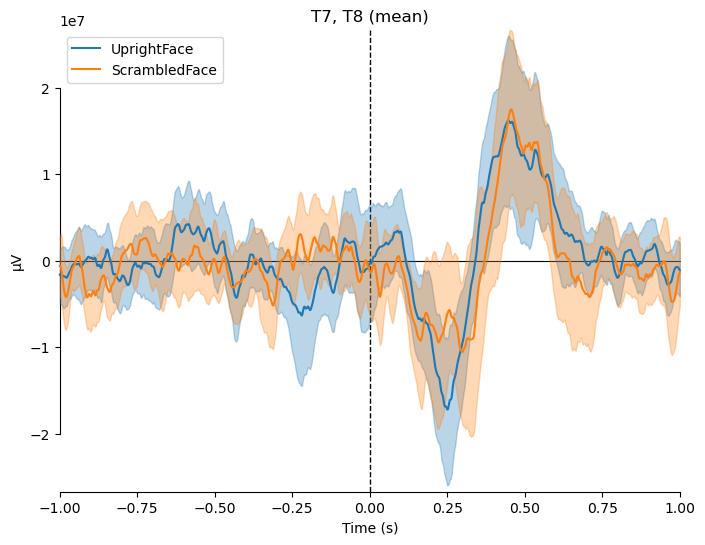

[<Figure size 800x600 with 1 Axes>]

In [24]:
evokeds = dict(UprightFace=list(epochs['UprightFace'].iter_evoked()),
               ScrambledFace=list(epochs['ScrambledFace'].iter_evoked()))

mne.viz.plot_compare_evokeds(evokeds, combine='mean', picks=picks)

No projector specified for this dataset. Please consider the method self.add_proj.


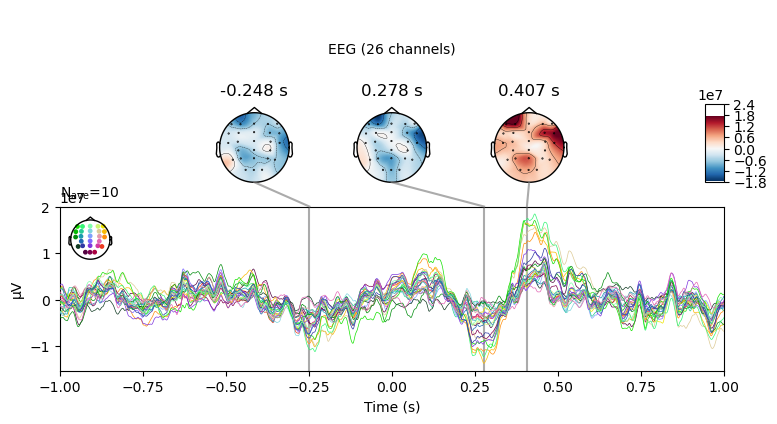

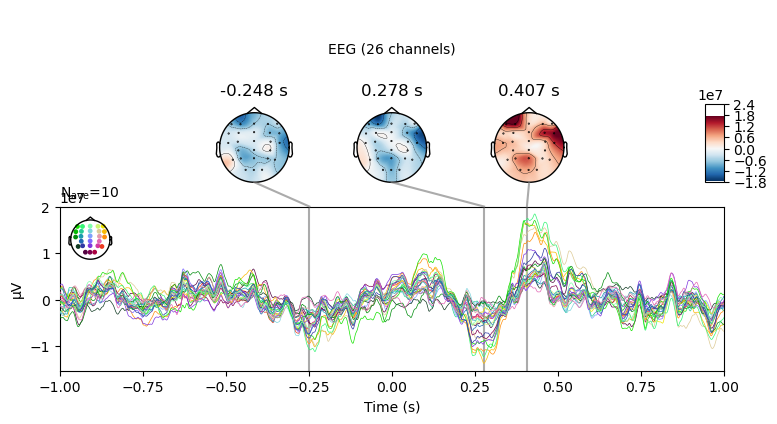

In [25]:
upright_minus_scrambled = mne.combine_evoked([upright_epochs, object_epochs], weights=[1, -1])
upright_minus_scrambled.plot_joint()